In [1]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.image import pad_to_bounding_box
from tensorflow.image import central_crop
from tensorflow.image import resize

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
bgd = image.load_img('dogs.png')

In [4]:
image.img_to_array(bgd) # 이미지를 array로 변환
image.img_to_array(bgd).shape # (높이, 너비, 채널)

(1157, 1148, 3)

In [5]:
bgd_vector = np.asarray(image.img_to_array(bgd))
bgd_vector = bgd_vector/255 # 정규화

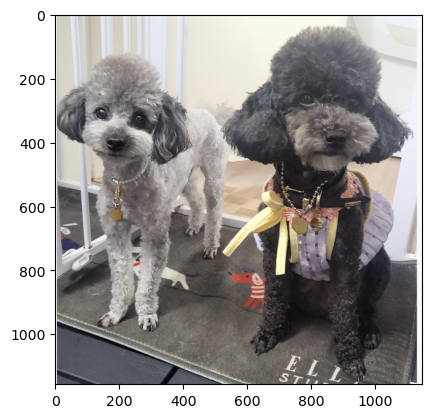

In [6]:
plt.imshow(bgd_vector)
plt.show()

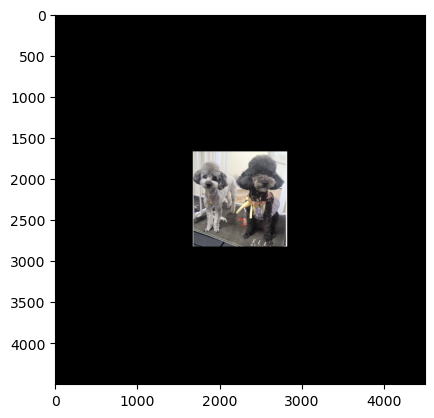

In [7]:
#이미지의 변경할 크기 설정 
target_height = 4500
target_width = 4500
 
#현재 이미지의 크기 지정 
source_height = bgd_vector.shape[0]
source_width = bgd_vector.shape[1]
 
#padding 실시 : pad_to_bounding_box 사용 
bgd_vector_pad = pad_to_bounding_box(bgd_vector, 
                                     int((target_height-source_height)/2), 
                                     int((target_width-source_width)/2), 
                                     target_height, 
                                     target_width)
                                     
 #이미지 형태 확인 
bgd_vector_pad.shape
 
#이미지 확인 
plt.imshow(bgd_vector_pad)
plt.show()

#이미지 저장 
image.save_img('dogs_pad.png', bgd_vector_pad)

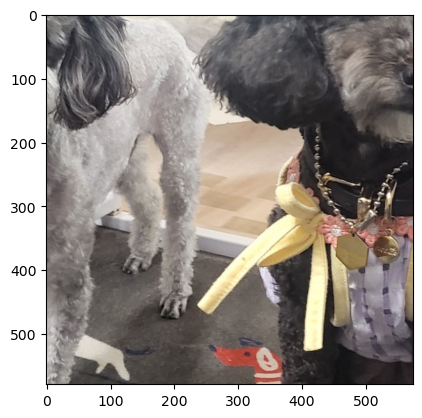

In [8]:
#가운데를 중심으로 50%만 crop 
bgd_vector_crop = central_crop(bgd_vector, .5)
 
bgd_vector_crop.shape
 
plt.imshow(bgd_vector_crop)
plt.show()

In [9]:
#사전학습 모델 불러오기 : 케라스에서 클래스 형태로 제공함 
from tensorflow.keras.applications.vgg16 import VGG16
 
#weight, include_top 파라미터 설정 
model = VGG16(weights='imagenet', include_top=True)
model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [10]:
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image
 
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras.applications.imagenet_utils import decode_predictions
from tensorflow.keras.applications.imagenet_utils import preprocess_input
import numpy as np
 
img = Image.open('dogs.png')

In [11]:
w, h = img.size
s = min(w,h)

In [12]:
y = (h-s)//2
x = (w-s)//2
print(w,h,x,y,s)

1148 1157 0 4 1148


In [13]:
img = img.crop((x,y,x+s,y+s))
img.size

(1148, 1148)

In [14]:
model.layers[0].input_shape

[(None, 224, 224, 3)]

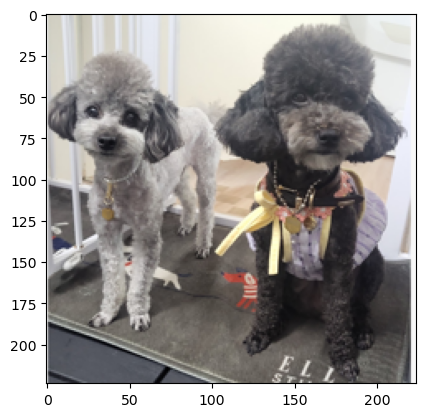

In [15]:
target_size = 224
img = img.resize((target_size,target_size))
plt.imshow(np.asarray(img))
plt.show()

In [16]:
np_img = image.img_to_array(img)
np_img.shape  #(224, 224, 3)

(224, 224, 3)

In [17]:
img_batch = np.expand_dims(np_img, axis=0)
img_batch.shape # 4차원으로

(1, 224, 224, 3)

In [18]:
pre_processed = preprocess_input(img_batch)

In [19]:
y_preds = model.predict(pre_processed)
 
y_preds.shape  # 종속변수가 취할 수 있는 값의 수 = 1000
 
np.set_printoptions(suppress=True, precision=10)
y_preds
 
#가장 확률이 높은 값
np.max(y_preds)

1/1 [==============================] - 0s 251ms/step


0.78416103

In [20]:
decode_predictions(y_preds, top=10)

[[('n02113624', 'toy_poodle', 0.78416103),
  ('n02113712', 'miniature_poodle', 0.16782114),
  ('n02096437', 'Dandie_Dinmont', 0.01923898),
  ('n02093647', 'Bedlington_terrier', 0.016176438),
  ('n02113799', 'standard_poodle', 0.012043098),
  ('n02097047', 'miniature_schnauzer', 8.5362444e-05),
  ('n02105641', 'Old_English_sheepdog', 8.354024e-05),
  ('n02086240', 'Shih-Tzu', 7.7943914e-05),
  ('n02085936', 'Maltese_dog', 1.9853807e-05),
  ('n02106382', 'Bouvier_des_Flandres', 1.9203428e-05)]]

In [21]:
image = Image.open('dogs.png').resize((500, 400))

In [22]:
image_tensor = tf.keras.preprocessing.image.img_to_array(image)

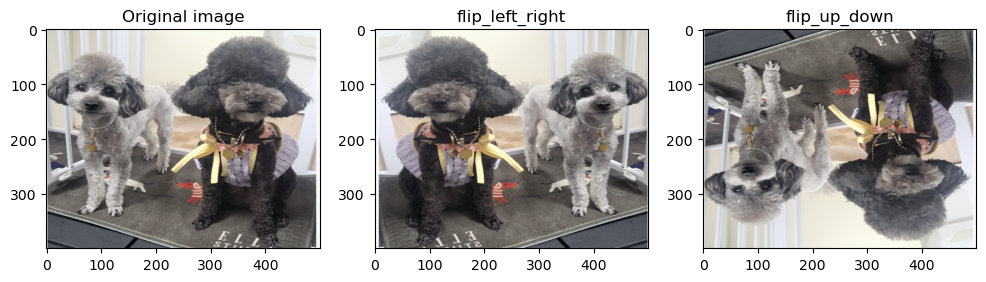

In [23]:
flip_lr_tensor = tf.image.flip_left_right(image_tensor)
flip_ud_tensor = tf.image.flip_up_down(image_tensor)
flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)


plt.figure(figsize=(12,12))

plt.subplot(1,3,1)
plt.title('Original image')
plt.imshow(image)

plt.subplot(1,3,2)
plt.title('flip_left_right')
plt.imshow(flip_lr_image) # 좌우 반전

plt.subplot(1,3,3)
plt.title('flip_up_down')
plt.imshow(flip_ud_image) # 상하 반전

plt.show()

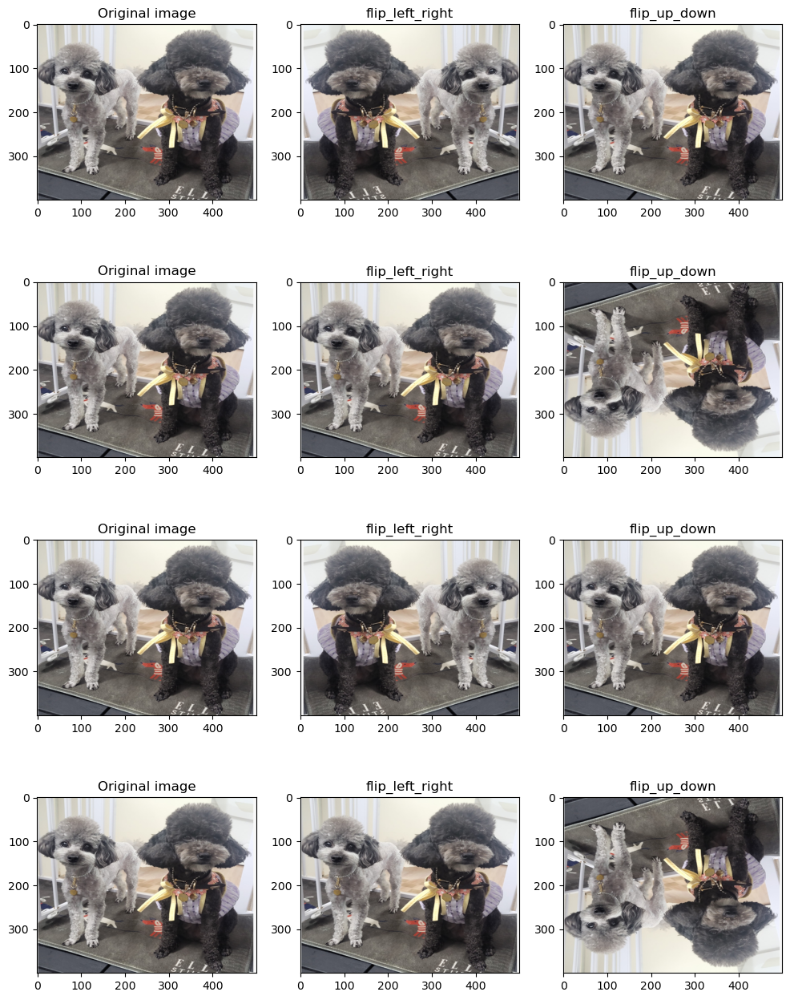

In [24]:
plt.figure(figsize=(12,16))

row = 4
for i in range(row):
  flip_lr_tensor = tf.image.random_flip_left_right(image_tensor)
  flip_ud_tensor = tf.image.random_flip_up_down(image_tensor)
  flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
  flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)

  plt.subplot(4,3, i*3+1)
  plt.title('Original image')
  plt.imshow(image)

  plt.subplot(4,3,i*3+2)
  plt.title('flip_left_right')
  plt.imshow(flip_lr_image)

  plt.subplot(4,3,i*3+3)
  plt.title('flip_up_down')
  plt.imshow(flip_ud_image)

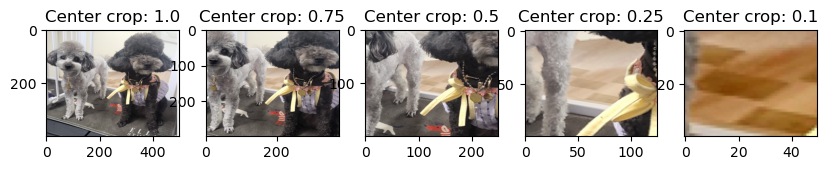

In [25]:
plt.figure(figsize=(12,15))

central_fractions = [1.0, 0.75, 0.5, 0.25, 0.1] # 중앙 기준 확대
col = len(central_fractions)
for i, frac in enumerate(central_fractions):
  cropped_tensor = tf.image.central_crop(image_tensor, frac)
  cropped_img = tf.keras.preprocessing.image.array_to_img(cropped_tensor)

  plt.subplot(1, col+1, i+1)
  plt.title(f'Center crop: {frac}')
  plt.imshow(cropped_img)

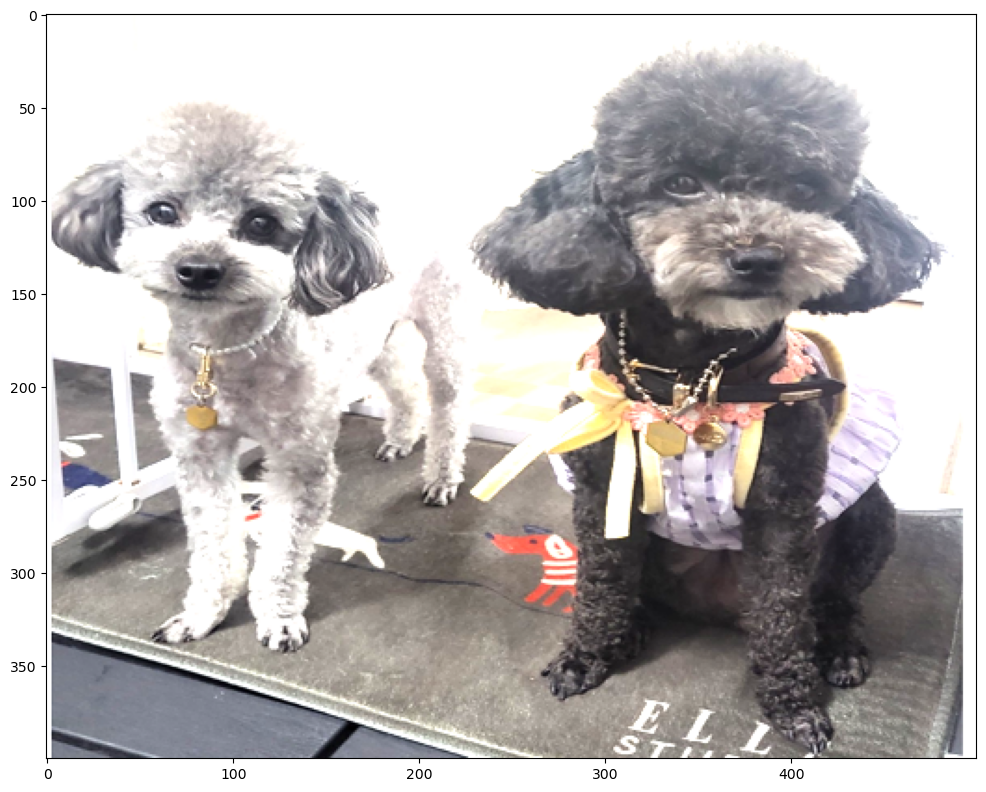

In [26]:
plt.figure(figsize=(12, 15))

random_bright_tensor = tf.image.random_brightness(image_tensor, max_delta=128)
random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255)
random_bright_image = tf.keras.preprocessing.image.array_to_img(random_bright_tensor)

plt.imshow(random_bright_image)
plt.show()

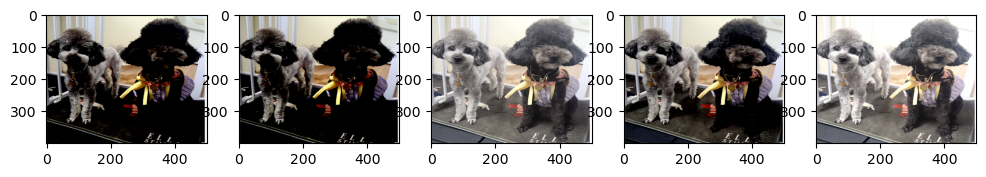

In [27]:
plt.figure(figsize=(12,15))

for i in range(5):
  random_bright_tensor = tf.image.random_brightness(image_tensor, max_delta=128) # 밝기 조절
  random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255)
  random_bright_image = tf.keras.preprocessing.image.array_to_img(random_bright_tensor)

  plt.subplot(1, 5, i+1)
  plt.imshow(random_bright_image)

In [28]:
pip install albumentations

Note: you may need to restart the kernel to use updated packages.


In [29]:
image = Image.open('dogs.png').resize((400, 300)) 
image_arr = np.array(image)
image_arr.shape

(300, 400, 3)

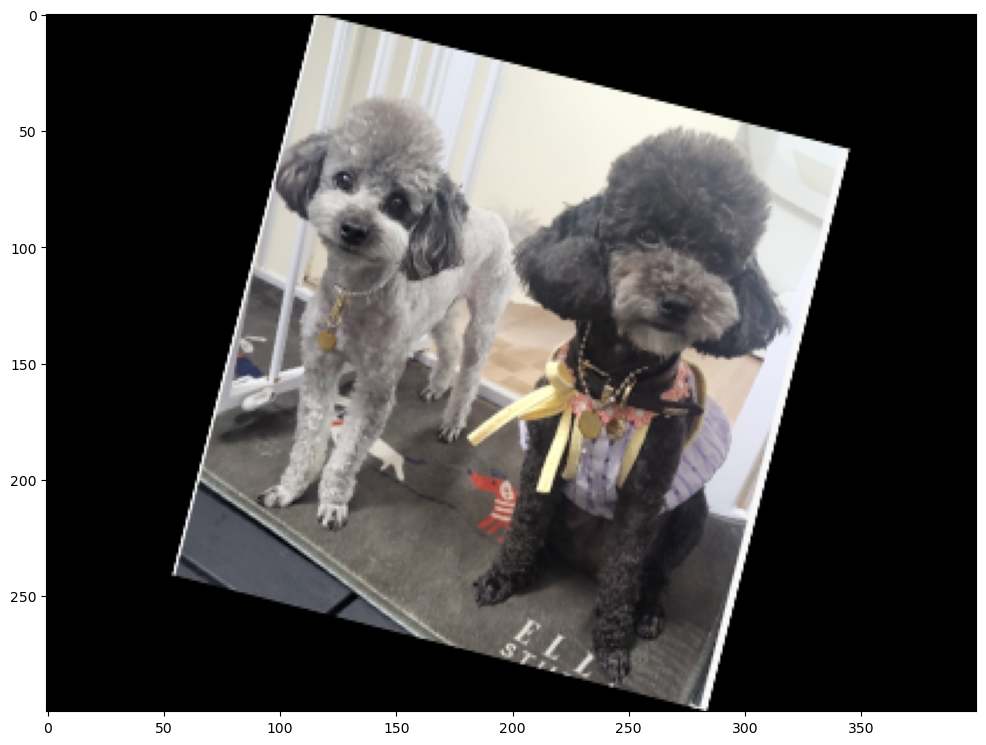

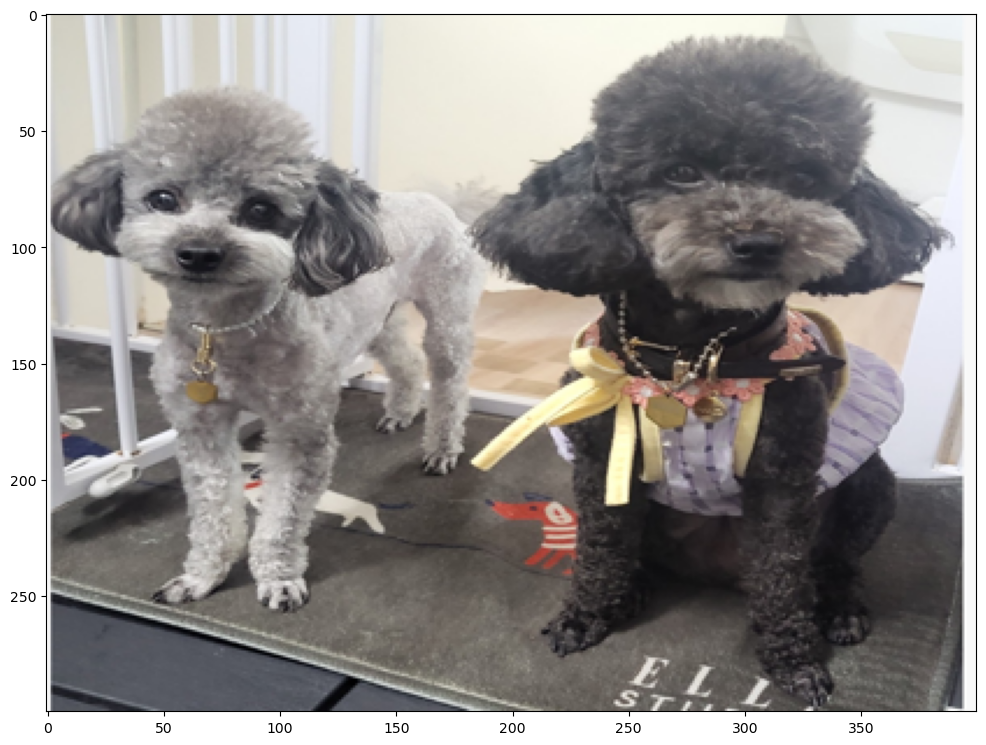

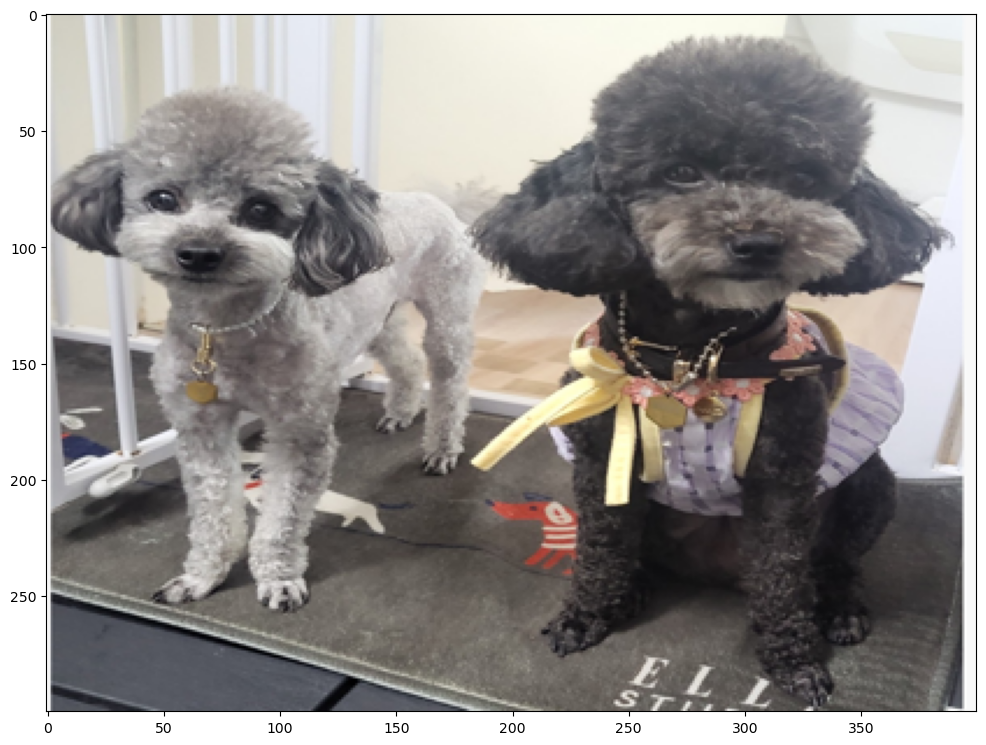

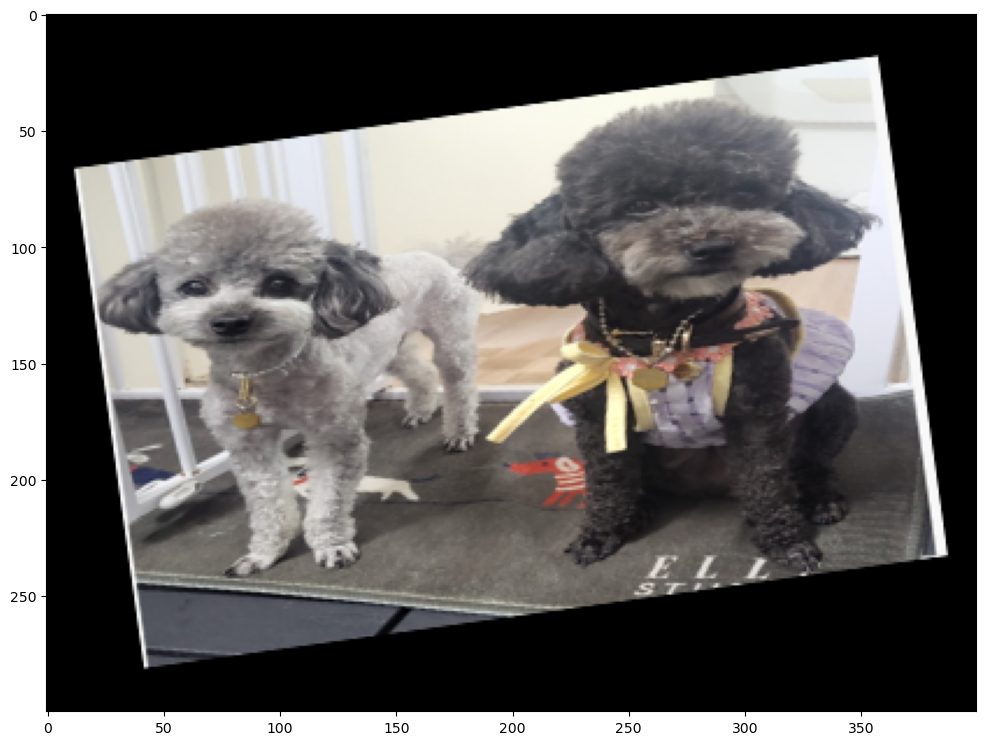

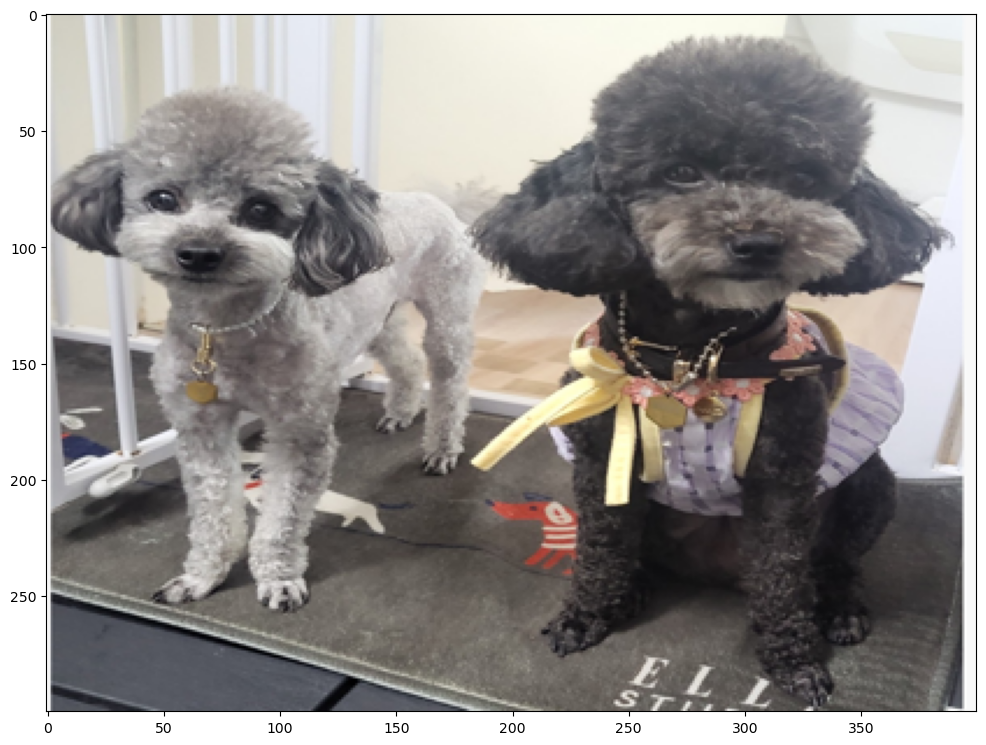

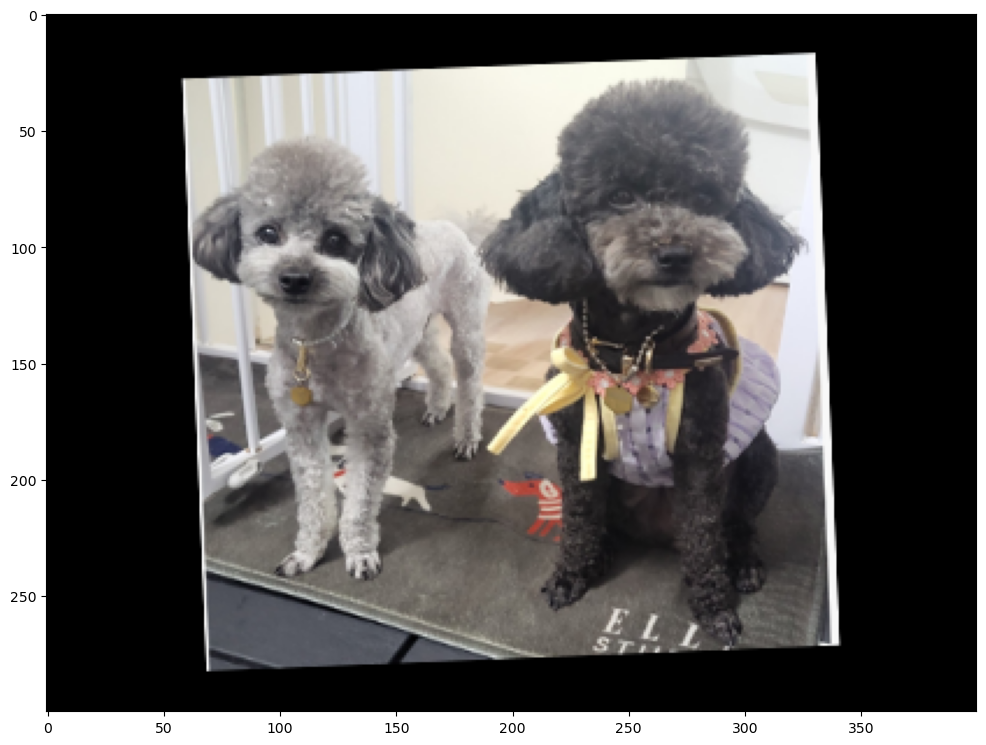

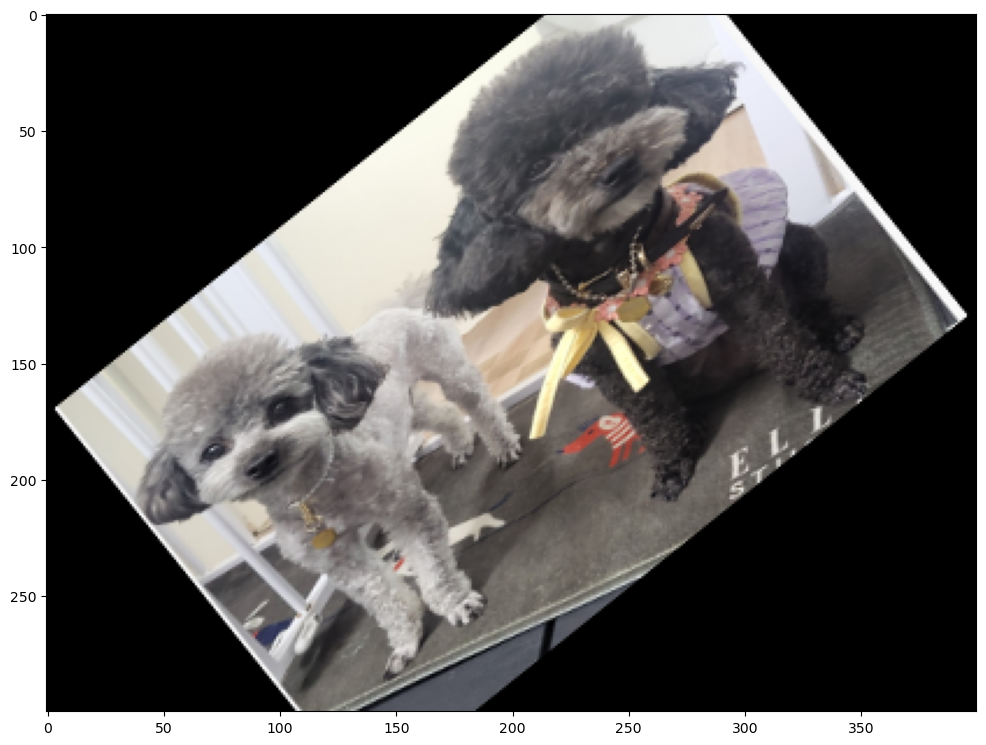

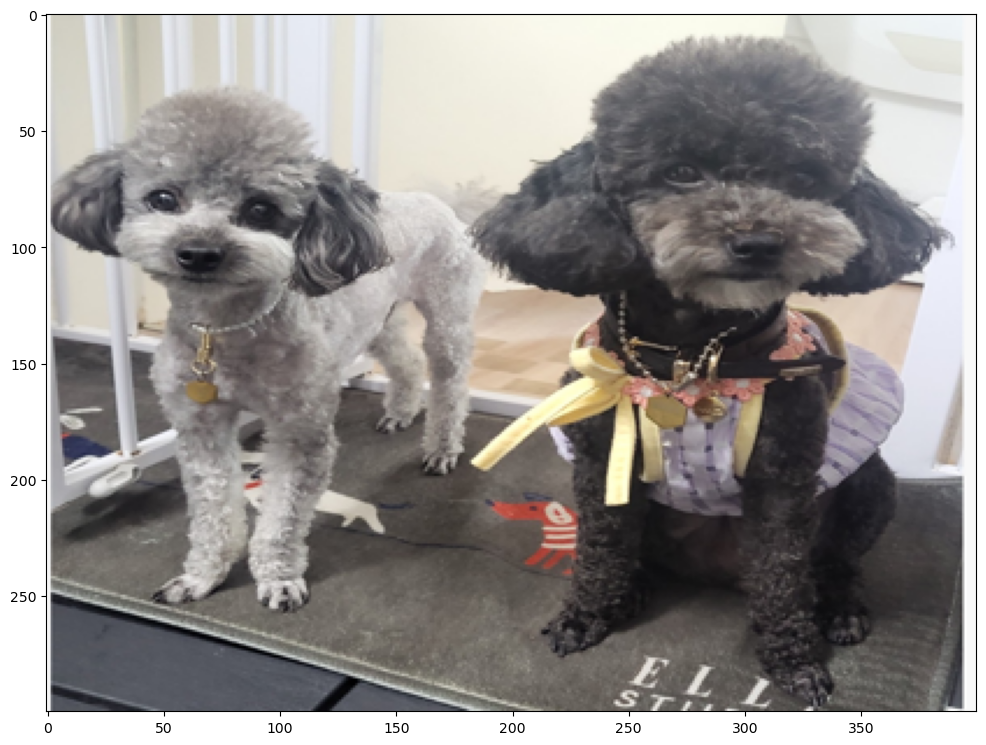

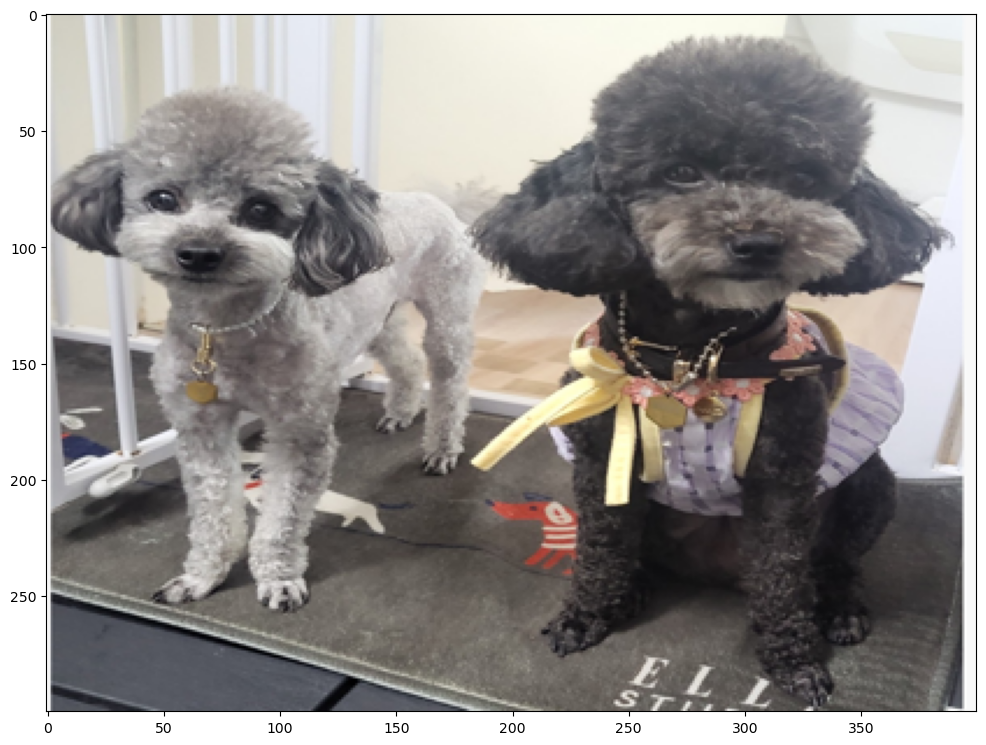

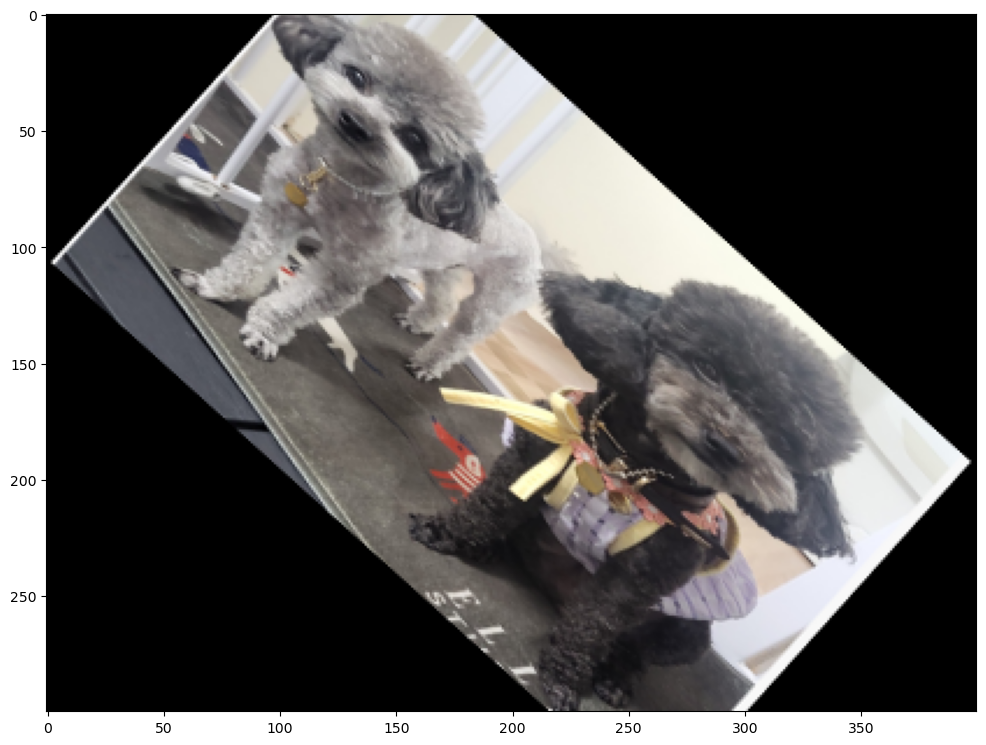

In [30]:
import albumentations as A

for i in range(10):
    transform = A.Compose([
      A.Affine(rotate=(-45,45), scale=(0.5,0.9), p=0.5)
    ])
    transformed = transform(image=image_arr)
    plt.figure(figsize=(12,12))
    plt.imshow((transformed['image']))
    plt.show()

In [31]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
from tensorflow.image import pad_to_bounding_box
from tensorflow.image import central_crop
from tensorflow.image import resize
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D
from keras.utils import to_categorical
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping
from PIL import Image
import os

In [32]:
image_list = []
target_size = (500, 150)  
for i in range(200):
    image_path = f'tf_image/train_{i:03}.png'
    
    if not os.path.exists(image_path):
        image_path = f'tf_image/train_{i:03}.jpg'

        
    image = Image.open(image_path).convert("RGB")
    image = image.resize(target_size, Image.ANTIALIAS)
    image_array = np.array(image)
    image_list.append(image_array)
X_train = np.stack(image_list)
X_train.shape # (200, 150, 500, 3)

(200, 150, 500, 3)

In [33]:
image_list = []

for i in range(60):
    image_path = f'tf_image/test_{i:03}.png'
    
    if not os.path.exists(image_path):
        image_path = f'tf_image/test_{i:03}.jpg'
    
    image = Image.open(image_path).convert("RGB")
    image = image.resize((500,150))
    image_array = np.array(image)
    image_list.append(image_array)
    test = image_list[0]
X_test = np.stack(image_list) 
X_test.shape # (60, 150, 500, 3)

(60, 150, 500, 3)

In [34]:
y_train = []
for i in range(200):
    user = (i // 10)   
    y_train.append(user)

y_test = []
for i in range(60):
    user = (i // 3)   
    y_test.append(user)

In [35]:
X_train = X_train.reshape(X_train.shape[0], 150, 500, 3).astype('float32') / 255
X_test = X_test.reshape(X_test.shape[0], 150, 500, 3).astype('float32') / 255
y_train = to_categorical(y_train, num_classes=20)
y_test = to_categorical(y_test, num_classes=20)

In [36]:
model = Sequential()

In [37]:
model.add(Conv2D(32, kernel_size=(3, 3), input_shape=(150, 500, 3), activation='relu'))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(20, activation='softmax')) 
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [38]:
model.fit(X_train, y_train, epochs=25, batch_size=200, verbose=1)

Epoch 1/25
1/1 [==============================] - 11s 11s/step - loss: 3.0146 - accuracy: 0.0500
Epoch 2/25
1/1 [==============================] - 11s 11s/step - loss: 107.3828 - accuracy: 0.0500
Epoch 3/25
1/1 [==============================] - 10s 10s/step - loss: 76.9320 - accuracy: 0.0500
Epoch 4/25
1/1 [==============================] - 11s 11s/step - loss: 37.8060 - accuracy: 0.0500
Epoch 5/25
1/1 [==============================] - 11s 11s/step - loss: 27.4314 - accuracy: 0.0750
Epoch 6/25
1/1 [==============================] - 11s 11s/step - loss: 21.2242 - accuracy: 0.1350
Epoch 7/25
1/1 [==============================] - 11s 11s/step - loss: 11.4037 - accuracy: 0.0750
Epoch 8/25
1/1 [==============================] - 11s 11s/step - loss: 5.5727 - accuracy: 0.1950
Epoch 9/25
1/1 [==============================] - 11s 11s/step - loss: 2.6106 - accuracy: 0.3900
Epoch 10/25
1/1 [==============================] - 10s 10s/step - loss: 1.5795 - accuracy: 0.5600
Epoch 11/25
1/1 [=====

In [39]:
print(f'정확도 :{model.evaluate(X_test,y_test)[1]}')

2/2 [==============================] - 1s 281ms/step - loss: 4.4371 - accuracy: 0.4833
정확도 :0.4833333194255829
